<a href="https://colab.research.google.com/github/WellFan/machinelearning_2023_final/blob/main/html2023_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# XGboost with classification and regression

# Data Preprocessing


## Import packages and data

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
url = '/content/drive/MyDrive/Colab Notebooks/html2023-spring-final-project/'
df = pd.read_csv(url + 'train.csv')

Mounted at /content/drive


## Data statistics

In [ ]:
df.head()

,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,...,Album,Uri,Url_spotify,Url_youtube,Comments,Description,Title,Channel,Composer,Artist
0,0.0,0.000273,3.0,-25.176,0.0443,0.724151,0.000062,0.000807,0.340,83.398,...,Sinkovsky Plays and Sings Vivaldi,spotify:track:7njAZhca4o80qQdCgyEWya,https://open.spotify.com/artist/2QOIawHpSlOwXD...,https://www.youtube.com/watch?v=NzCL9uLkQSI,3070.0,Antonio Vivaldi's 4th Concerto - From his Most...,"Antonio Vivaldi - Concerto No.4 in F minor, Op...",Mozafunkula,NaN,Marshmello
1,0.0,0.184220,7.0,NaN,NaN,0.672221,0.910000,0.034966,0.746,148.692,...,NaN,spotify:track:2nnXe7n3Vivs7OfQKRsfWD,https://open.spotify.com/artist/2QOIawHpSlOwXD...,https://www.youtube.com/watch?v=jAnzlpPuIDU,122.0,"A. Vivaldi Concerto No. 2 in G minor, RV 315, ...","A. Vivaldi Concerto No. 2 in G minor, RV 315, ...",Anton Paisov,Finneas O'Connell,Bon Iver
2,0.0,NaN,6.0,-15.596,NaN,0.667628,0.867000,0.001772,0.380,84.899,...,Vivaldi: The Four Seasons,spotify:track:0VQMAup2VdeQWLCvM14Uz2,https://open.spotify.com/artist/2QOIawHpSlOwXD...,https://www.youtube.com/watch?v=jAnzlpPuIDU,122.0,"A. Vivaldi Concerto No. 2 in G minor, RV 315, ...",NaN,Anton Paisov,Finneas O'Connell,Kamasi Washington
3,1.0,0.209585,NaN,-6.251,0.0277,0.003796,NaN,0.001000,NaN,150.220,...,Life Thru A Lens,spotify:track:1M2nd8jNUkkwrc1dgBPTJz,https://open.spotify.com/artist/2HcwFjNelS49kF...,https://www.youtube.com/watch?v=luwAMFcc2f8,24350.0,25 years of Life Thru A Lens. Pre-order the br...,Robbie Williams - Angels,robbiewilliamsvevo,Louis Bell,Drake
4,4.0,NaN,5.0,NaN,0.0260,0.000003,0.000467,0.002924,0.295,97.997,...,Escapology,spotify:track:2Ms33RTRCT6gArrpcrPxmo,https://open.spotify.com/artist/2HcwFjNelS49kF...,https://www.youtube.com/watch?v=iy4mXZN1Zzk,31150.0,25 years of Life Thru A Lens. Pre-order the br...,Robbie Williams - Feel,robbiewilliamsvevo,Juicy J,Alicia Keys


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17170 entries, 0 to 17169
Data columns (total 29 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Danceability      17170 non-null  float64
 1   Energy            14615 non-null  float64
 2   Key               14568 non-null  float64
 3   Loudness          14601 non-null  float64
 4   Speechiness       14655 non-null  float64
 5   Acousticness      14593 non-null  float64
 6   Instrumentalness  14569 non-null  float64
 7   Liveness          14635 non-null  float64
 8   Valence           14596 non-null  float64
 9   Tempo             14608 non-null  float64
 10  Duration_ms       14567 non-null  float64
 11  Views             14574 non-null  float64
 12  Likes             14591 non-null  float64
 13  Stream            14602 non-null  float64
 14  Album_type        14610 non-null  object 
 15  Licensed          14577 non-null  object 
 16  official_video    14555 non-null  object

In [ ]:
df.describe()

,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Likes,Stream,id,Comments
count,17170.000000,1.461500e+04,14568.000000,14601.000000,14655.000000,1.459300e+04,14569.000000,14635.000000,14596.000000,14608.000000,1.456700e+04,1.457400e+04,1.459100e+04,1.460200e+04,17170.000000,1.458900e+04
mean,4.586022,3.358392e-01,5.231604,-7.561370,0.095462,1.148404e-01,0.054934,0.033745,0.525842,120.937819,2.228307e+05,8.791096e+07,6.485064e+05,1.290426e+08,8584.500000,2.810321e+04
std,2.858980,2.426825e-01,3.456986,4.540944,0.103068,2.215160e-01,0.191392,0.114862,0.244912,29.665225,1.211659e+05,2.523918e+08,1.726157e+06,2.417681e+08,4956.696396,2.142922e+05
min,0.000000,8.365427e-15,0.000000,-46.251000,0.000000,1.367631e-18,0.000000,0.000003,0.000000,0.000000,3.098500e+04,2.600000e+01,0.000000e+00,6.574000e+03,0.000000,0.000000e+00
25%,2.000000,1.342177e-01,2.000000,-8.655000,0.036100,9.797218e-05,0.000000,0.000836,0.336000,97.041000,1.793055e+05,1.971684e+06,2.251600e+04,1.628195e+07,4292.250000,5.340000e+02
50%,5.000000,2.954083e-01,5.000000,-6.472000,0.051400,6.967871e-03,0.000002,0.001907,0.531000,119.995500,2.120300e+05,1.427208e+07,1.239210e+05,4.550224e+07,8584.500000,3.171000e+03
75%,7.000000,5.062616e-01,8.000000,-4.920000,0.106000,1.025032e-01,0.000392,0.012487,0.722000,139.990250,2.495115e+05,6.603988e+07,5.077155e+05,1.256493e+08,12876.750000,1.361900e+04
max,9.000000,1.000000e+00,10.000000,0.829000,0.964000,9.880479e-01,1.000000,1.000000,0.993000,243.372000,4.581483e+06,5.773798e+09,4.014762e+07,3.386520e+09,17169.000000,1.608314e+07


## Detect outlier
We investigate the following video with
1. Valence = 0
2. Like = 0
3. Instrumentalness = 1
4. Tempo = 0
5. Duration > $10^6$ ms

Except the 'duration' and 'like', the outliers of remaining features are abnormal 
but useful for classfication(danceability = 0).

In [ ]:
df[df.Duration_ms>1e6]

,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,...,Album,Uri,Url_spotify,Url_youtube,Comments,Description,Title,Channel,Composer,Artist
701,2.0,NaN,7.0,-4.501,0.0794,NaN,0.000013,0.003870,0.480,106.001,...,52 Non Stop Dilbar Dilbar Remix,spotify:track:1FSYDJAlyHAabWhiGgYfDq,https://open.spotify.com/artist/5rQoBDKFnd1n6B...,https://www.youtube.com/watch?v=RodJL429lFI,1257.0,T-Series present to you Full video of 52 Non S...,"52 Non Stop Dilbar Dilbar Remix By Kedrock, SD...",NaN,Finneas O'Connell,Shawn Mendes
2071,7.0,0.101195,3.0,NaN,0.0417,0.393833,0.000002,0.000921,0.812,137.159,...,Gayatri Mantra,spotify:track:3oj9ZcytkTaovswquxjzo1,https://open.spotify.com/artist/4hkB2bR5ek6lJC...,https://www.youtube.com/watch?v=Ro8cNBXfzs0,2917.0,Lyrics:\n\nॐ भूर्भुवः स्वः ।\nतत्सवितुर्वरेण्य...,Gayatri Mantra - Om Bhur Bhuva Swaha | Bhakti ...,Pratima Saran Spiritual,Terrace Martin,Kendrick Lamar
2478,2.0,0.586376,7.0,-4.501,0.0794,0.000209,0.000013,0.003870,NaN,NaN,...,52 Non Stop Dilbar Dilbar Remix,spotify:track:1FSYDJAlyHAabWhiGgYfDq,https://open.spotify.com/artist/5T2I75UlGBcWd5...,NaN,1257.0,T-Series present to you Full video of 52 Non S...,"52 Non Stop Dilbar Dilbar Remix By Kedrock, SD...",Pop Chartbusters,"Noah ""40"" Shebib",Major Lazer
2797,2.0,0.493039,NaN,-4.342,0.0503,0.012167,0.000040,0.009528,0.868,NaN,...,Hitazos: Amores Como el Nuestro / Que Fue / Al...,spotify:track:2ZixSR7OKIpdPUk4dwOekn,https://open.spotify.com/artist/2Htm0q72SjGSms...,https://www.youtube.com/watch?v=Hb6oSLn5wTw,0.0,Provided to YouTube by The Orchard Enterprises...,Hitazos: Amores Como el Nuestro / Que Fue / Al...,Daniel Cardozo - Topic,Finneas O'Connell,Julien Baker
2927,8.0,0.300763,6.0,-14.259,0.1770,0.000044,NaN,0.003242,0.903,102.336,...,"Playero 37 ""Underground""",spotify:track:6ZbWeRhL76RXghqoMNF932,NaN,https://www.youtube.com/watch?v=U6UHODcFpAQ,31.0,Dj Playero Underground 37 - Daddy Yankee,Dj Playero Underground 37 feat Daddy Yankee - ...,Tomas Acuña,Yeti Beats,Swedish House Mafia
2929,9.0,NaN,1.0,-11.922,0.0949,0.000017,0.000055,0.010794,0.653,106.834,...,"Playero 38 ""Underground""",spotify:track:5EVCuT4L4hsyDtA7H1yByW,NaN,https://www.youtube.com/watch?v=uIhI2KFQ0pc,88.0,old school,M.C. NON STOP REGGAE Vol. 1 - Dj Playero,ernestor2711,Terrace Martin,The Chainsmokers
3361,2.0,0.493039,NaN,NaN,0.0503,0.012167,0.000040,0.009528,0.868,97.512,...,Hitazos: Amores Como el Nuestro / Que Fue / Al...,spotify:track:2ZixSR7OKIpdPUk4dwOekn,https://open.spotify.com/artist/2Mu8h5sFkOziL0...,https://www.youtube.com/watch?v=Hb6oSLn5wTw,0.0,Provided to YouTube by The Orchard Enterprises...,Hitazos: Amores Como el Nuestro / Que Fue / Al...,Daniel Cardozo - Topic,Mike Dean,Flume
4743,2.0,0.586376,7.0,-4.501,NaN,0.000209,0.000013,0.003870,0.480,106.001,...,52 Non Stop Dilbar Dilbar Remix,NaN,https://open.spotify.com/artist/0NErdIJtuKBjtx...,https://www.youtube.com/watch?v=RodJL429lFI,NaN,T-Series present to you Full video of 52 Non S...,"52 Non Stop Dilbar Dilbar Remix By Kedrock, SD...",Pop Chartbusters,Yeti Beats,Mitski
6541,0.0,0.985075,1.0,-17.379,0.0612,0.809558,0.562000,0.029791,NaN,84.788,...,Ocean Waves,spotify:track:1saXdvEAafdRzUphXBzSHg,https://open.spotify.com/artist/2CgVSpL4tfbUuH...,https://www.youtube.com/watch?v=bn9F19Hi1Lk,6499.0,A wonderful experience of sleeping beside the ...,NaN,Naturaleza Viva - Sonidos y Paisajes Increíbles,Finneas O'Connell,J. Cole
7001,2.0,0.586376,7.0,-4.501,0.0794,0.000209,NaN,0.003870,0.480,106.001,...,52 Non Stop Dilbar Dilbar Remix,NaN,https://open.spotify.com/artist/0T1CMVkqffHlqE...,https://www.youtube.com/watch?v=RodJL429lFI,1257.0,T-Series present to you Full video of 52 Non S...,"52 Non Stop Dilbar Dilbar Remix By Kedrock, SD...",Pop Chartbusters,Yeti Beats,The National


In [ ]:
df[df.Instrumentalness==1]

,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,...,Album,Uri,Url_spotify,Url_youtube,Comments,Description,Title,Channel,Composer,Artist
10666,0.0,4.000169e-08,NaN,-28.460,0.0,0.494914,1.0,0.001368,0.0,0.0,...,Best White Noise for Baby Sleep - Loopable wit...,spotify:track:2bRKxuH1o7pTmb1y4GfdEc,https://open.spotify.com/artist/4ZfEELHfyKd4od...,NaN,NaN,Provided to YouTube by Symphonic Distribution\...,Clean White Noise - Loopable With No Fade,NaN,Finneas O'Connell,Daft Punk
10667,0.0,1.953125e-09,1.0,-27.592,0.0,0.748613,1.0,0.001368,0.0,0.0,...,Best White Noise for Baby Sleep - Loopable wit...,spotify:track:5I21rMWLtCjWQl6QyLn85W,https://open.spotify.com/artist/4ZfEELHfyKd4od...,https://www.youtube.com/watch?v=snlA7rFR0iQ,597.0,Brown noise can help you relax and get some sl...,"Brown Noise, Black Screen 🟤⬛ • 12 hours • No ads",DJ Grossman,Finneas O'Connell,The Chainsmokers
10668,0.0,1.663750e-13,10.0,-21.995,0.0,0.781230,1.0,0.001482,0.0,NaN,...,Best White Noise for Baby Sleep - Loopable wit...,spotify:track:4f9s3wr1e1QdpMDxQosSTz,https://open.spotify.com/artist/4ZfEELHfyKd4od...,https://www.youtube.com/watch?v=gUkNfU0z9ts,0.0,NaN,Air Conditioner - Loopable With No Fade,White Noise - Topic,Finneas O'Connell,Alicia Keys
10670,0.0,1.953125e-09,1.0,NaN,0.0,0.748613,1.0,NaN,NaN,NaN,...,White Noise,NaN,https://open.spotify.com/artist/4ZfEELHfyKd4od...,https://www.youtube.com/watch?v=nMfPqeZjc2c,30861.0,"By popular request, here is one of our most so...","White Noise Black Screen | Sleep, Study, Focus...",Relaxing White Noise,Finneas O'Connell,Bon Iver
12328,0.0,1.953125e-09,NaN,-27.592,0.0,0.748613,1.0,0.001368,0.0,0.0,...,Best White Noise for Baby Sleep - Loopable wit...,spotify:track:5I21rMWLtCjWQl6QyLn85W,NaN,https://www.youtube.com/watch?v=1hSNJvE4c70,0.0,Provided to YouTube by TuneCore\n\nBaby Sleep ...,Baby Sleep Brown Noise,littleONES - Topic,Finneas O'Connell,Lizzo
12334,0.0,1.663750e-13,10.0,-21.995,0.0,0.781230,1.0,NaN,0.0,0.0,...,Best White Noise for Baby Sleep - Loopable wit...,spotify:track:4f9s3wr1e1QdpMDxQosSTz,https://open.spotify.com/artist/4W12lEvVl5wect...,NaN,0.0,Provided to YouTube by Symphonic Distribution\...,Air Conditioner - Loopable With No Fade,White Noise - Topic,Finneas O'Connell,Drake


In [ ]:
df[df.Tempo == 0]

,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,...,Album,Uri,Url_spotify,Url_youtube,Comments,Description,Title,Channel,Composer,Artist
633,0.0,NaN,1.0,-7.977,0.0,7.251171e-08,0.878,0.219256,NaN,0.0,...,Israeli Salad,spotify:track:6quMGNh47CpSR5kmZSYSTK,https://open.spotify.com/artist/0eVyjRhzZKke2K...,https://www.youtube.com/watch?v=VOzGHqs9bRM,21.0,Provided to YouTube by Empire Distribution\n\n...,Arrival,The Alchemist - Topic,Finneas O'Connell,Kendrick Lamar
4559,0.0,6.496481e-02,NaN,NaN,0.0,9.183300e-01,NaN,0.721734,0.0,0.0,...,The Three Tenors - The Best of the 3 Tenors,spotify:track:4mZlQk9Ha7WwJZUngARQeY,https://open.spotify.com/artist/0Y8KmFkKOgJybp...,https://www.youtube.com/watch?v=xCFEk6Y8TmM,9002.0,"The ""king"" Luciano Pavarotti as Il Duca di Man...",Luciano Pavarotti - La Donna È Mobile (Rigoletto),NaN,Finneas O'Connell,Lizzo
5628,0.0,1.157625e-03,7.0,-13.925,0.0,9.673617e-01,NaN,0.001260,0.0,0.0,...,You And The Night,NaN,https://open.spotify.com/artist/63MQldklfxkjYD...,https://www.youtube.com/watch?v=Ifpj8xnidVg,11.0,You and The Night Full album stream playlist: ...,M83 - Adieux (audio),M83,Finneas O'Connell,"Tyler, The Creator"
6453,0.0,4.743793e-05,0.0,-22.519,0.0,9.821078e-01,0.940,0.000879,0.0,0.0,...,NaN,spotify:track:59gg6zQhSKGVnkT3hWAY3l,https://open.spotify.com/artist/1YZhNFBxkEB5UK...,https://www.youtube.com/watch?v=2Yq46W11Rng,20.0,Provided to YouTube by Universal Music Group\n...,Richter: The Departure,Lang Lang - Topic,Louis Bell,Billie Eilish
6531,0.0,1.600301e-11,9.0,-17.746,0.0,8.519714e-07,0.877,0.523607,0.0,0.0,...,Soothing Brown Noise Waves and Calming Ambient...,spotify:track:0tIkLggEJ9QriD7KFz1GGA,https://open.spotify.com/artist/7g56xCsozigPH5...,https://www.youtube.com/watch?v=m5ZJAOaCQZ4,0.0,Provided to YouTube by Vydia\n\nbeach waves an...,beach waves and soothing brown noise,Ocean Sounds for Sleeping - Topic,NaN,Drake
6539,0.0,1.600301e-11,NaN,-17.746,0.0,8.519714e-07,0.877,0.523607,0.0,0.0,...,Soothing Brown Noise Waves and Calming Ambient...,spotify:track:0tIkLggEJ9QriD7KFz1GGA,https://open.spotify.com/artist/2CgVSpL4tfbUuH...,https://www.youtube.com/watch?v=m5ZJAOaCQZ4,0.0,NaN,beach waves and soothing brown noise,NaN,Finneas O'Connell,Travis Scott
10666,0.0,4.000169e-08,NaN,-28.460,0.0,4.949137e-01,1.000,0.001368,0.0,0.0,...,Best White Noise for Baby Sleep - Loopable wit...,spotify:track:2bRKxuH1o7pTmb1y4GfdEc,https://open.spotify.com/artist/4ZfEELHfyKd4od...,NaN,NaN,Provided to YouTube by Symphonic Distribution\...,Clean White Noise - Loopable With No Fade,NaN,Finneas O'Connell,Daft Punk
10667,0.0,1.953125e-09,1.0,-27.592,0.0,7.486133e-01,1.000,0.001368,0.0,0.0,...,Best White Noise for Baby Sleep - Loopable wit...,spotify:track:5I21rMWLtCjWQl6QyLn85W,https://open.spotify.com/artist/4ZfEELHfyKd4od...,https://www.youtube.com/watch?v=snlA7rFR0iQ,597.0,Brown noise can help you relax and get some sl...,"Brown Noise, Black Screen 🟤⬛ • 12 hours • No ads",DJ Grossman,Finneas O'Connell,The Chainsmokers
10669,0.0,1.581325e-02,2.0,-25.004,0.0,1.685159e-03,NaN,NaN,0.0,0.0,...,White Noise,spotify:track:37p7Z5FR1eHvpv8c0WDsIC,https://open.spotify.com/artist/4ZfEELHfyKd4od...,https://www.youtube.com/watch?v=SY1WlF7XzlI,0.0,Provided to YouTube by Symphonic Distribution\...,Shower Sound - Loopable Without Fade,White Noise Babies - Topic,Finneas O'Connell,Kendrick Lamar
12326,0.0,4.000169e-08,8.0,-28.460,0.0,4.949137e-01,NaN,0.001368,0.0,0.0,...,Best White Noise for Baby Sleep - Loopable wit...,spotify:track:2bRKxuH1o7pTmb1y4GfdEc,https://open.spotify.com/artist/4W12lEvVl5wect...,https://www.youtube.com/watch?v=8h8p7TOykK8,0.0,Provided to YouTube by Symphonic Distribution\...,Clean White Noise - Loopable With No Fade,White Noise - Topic,Finneas O'Connell,Billie Eilish


In [ ]:
df[df.Likes == 0]

,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,...,Album,Uri,Url_spotify,Url_youtube,Comments,Description,Title,Channel,Composer,Artist
6721,7.0,0.435520,10.0,-4.477,0.0471,0.000001,0.000,0.029218,0.6200,128.047,...,Hands All Over,NaN,https://open.spotify.com/artist/04gDigrS5kc9YW...,https://www.youtube.com/watch?v=vMdDFHUHVBU,0.0,Moves Like Jagger - Studio Recording From The ...,Moves Like Jagger - Studio Recording From The ...,water Chillon,Terrace Martin,Phoebe Bridgers
10671,0.0,0.020346,1.0,-36.766,0.0955,0.460100,0.868,0.001405,0.0357,177.756,...,Best White Noise for Baby Sleep - Loopable wit...,spotify:track:1S6FEwVzb6rRQkmWkE7Lga,https://open.spotify.com/artist/4ZfEELHfyKd4od...,https://www.youtube.com/watch?v=RhiiykXv54k,0.0,Provided to YouTube by Symphonic Distribution\...,Womb Sound 1 - Loopable White Noise With No Fade,NaN,Finneas O'Connell,Megan Thee Stallion


In [ ]:
df[df.Valence == 0]

,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,...,Album,Uri,Url_spotify,Url_youtube,Comments,Description,Title,Channel,Composer,Artist
4559,0.0,6.496481e-02,NaN,NaN,0.0000,9.183300e-01,NaN,0.721734,0.0,0.000,...,The Three Tenors - The Best of the 3 Tenors,spotify:track:4mZlQk9Ha7WwJZUngARQeY,https://open.spotify.com/artist/0Y8KmFkKOgJybp...,https://www.youtube.com/watch?v=xCFEk6Y8TmM,9002.0,"The ""king"" Luciano Pavarotti as Il Duca di Man...",Luciano Pavarotti - La Donna È Mobile (Rigoletto),NaN,Finneas O'Connell,Lizzo
5628,0.0,1.157625e-03,7.0,-13.925,0.0000,9.673617e-01,NaN,0.001260,0.0,0.000,...,You And The Night,NaN,https://open.spotify.com/artist/63MQldklfxkjYD...,https://www.youtube.com/watch?v=Ifpj8xnidVg,11.0,You and The Night Full album stream playlist: ...,M83 - Adieux (audio),M83,Finneas O'Connell,"Tyler, The Creator"
6453,0.0,4.743793e-05,0.0,-22.519,0.0000,9.821078e-01,0.940000,0.000879,0.0,0.000,...,NaN,spotify:track:59gg6zQhSKGVnkT3hWAY3l,https://open.spotify.com/artist/1YZhNFBxkEB5UK...,https://www.youtube.com/watch?v=2Yq46W11Rng,20.0,Provided to YouTube by Universal Music Group\n...,Richter: The Departure,Lang Lang - Topic,Louis Bell,Billie Eilish
6531,0.0,1.600301e-11,9.0,-17.746,0.0000,8.519714e-07,0.877000,0.523607,0.0,0.000,...,Soothing Brown Noise Waves and Calming Ambient...,spotify:track:0tIkLggEJ9QriD7KFz1GGA,https://open.spotify.com/artist/7g56xCsozigPH5...,https://www.youtube.com/watch?v=m5ZJAOaCQZ4,0.0,Provided to YouTube by Vydia\n\nbeach waves an...,beach waves and soothing brown noise,Ocean Sounds for Sleeping - Topic,NaN,Drake
6539,0.0,1.600301e-11,NaN,-17.746,0.0000,8.519714e-07,0.877000,0.523607,0.0,0.000,...,Soothing Brown Noise Waves and Calming Ambient...,spotify:track:0tIkLggEJ9QriD7KFz1GGA,https://open.spotify.com/artist/2CgVSpL4tfbUuH...,https://www.youtube.com/watch?v=m5ZJAOaCQZ4,0.0,NaN,beach waves and soothing brown noise,NaN,Finneas O'Connell,Travis Scott
10666,0.0,4.000169e-08,NaN,-28.460,0.0000,4.949137e-01,1.000000,0.001368,0.0,0.000,...,Best White Noise for Baby Sleep - Loopable wit...,spotify:track:2bRKxuH1o7pTmb1y4GfdEc,https://open.spotify.com/artist/4ZfEELHfyKd4od...,NaN,NaN,Provided to YouTube by Symphonic Distribution\...,Clean White Noise - Loopable With No Fade,NaN,Finneas O'Connell,Daft Punk
10667,0.0,1.953125e-09,1.0,-27.592,0.0000,7.486133e-01,1.000000,0.001368,0.0,0.000,...,Best White Noise for Baby Sleep - Loopable wit...,spotify:track:5I21rMWLtCjWQl6QyLn85W,https://open.spotify.com/artist/4ZfEELHfyKd4od...,https://www.youtube.com/watch?v=snlA7rFR0iQ,597.0,Brown noise can help you relax and get some sl...,"Brown Noise, Black Screen 🟤⬛ • 12 hours • No ads",DJ Grossman,Finneas O'Connell,The Chainsmokers
10668,0.0,1.663750e-13,10.0,-21.995,0.0000,7.812300e-01,1.000000,0.001482,0.0,NaN,...,Best White Noise for Baby Sleep - Loopable wit...,spotify:track:4f9s3wr1e1QdpMDxQosSTz,https://open.spotify.com/artist/4ZfEELHfyKd4od...,https://www.youtube.com/watch?v=gUkNfU0z9ts,0.0,NaN,Air Conditioner - Loopable With No Fade,White Noise - Topic,Finneas O'Connell,Alicia Keys
10669,0.0,1.581325e-02,2.0,-25.004,0.0000,1.685159e-03,NaN,NaN,0.0,0.000,...,White Noise,spotify:track:37p7Z5FR1eHvpv8c0WDsIC,https://open.spotify.com/artist/4ZfEELHfyKd4od...,https://www.youtube.com/watch?v=SY1WlF7XzlI,0.0,Provided to YouTube by Symphonic Distribution\...,Shower Sound - Loopable Without Fade,White Noise Babies - Topic,Finneas O'Connell,Kendrick Lamar
10673,0.0,4.000169e-08,8.0,-28.460,0.0000,4.949137e-01,NaN,0.001368,0.0,NaN,...,NaN,spotify:track:17EEd5lZaDlR3129R5WIF1,https://open.spotify.com/artist/4ZfEELHfyKd4od...,https://www.youtube.com/watch?v=8h8p7TOykK8,0.0,Provided to YouTube by Symphonic Distribution\...,Clean White Noise - Loopable With No Fade,White Noise - Topic,Finneas O'Connell,J. Cole


## Fill the missing values
1. Fill the missing Views using linear regression on Stream
2. Replace Likes by Like rate
3. Fill NaN ing artist and composer with 'missing'
4. Fill remaining entries with median value of each feature

(array([2.072e+03, 4.713e+03, 5.066e+03, 3.315e+03, 0.000e+00, 1.415e+03,
        4.770e+02, 8.900e+01, 2.000e+01, 3.000e+00]),
 array([0. , 0.8, 1.6, 2.4, 3.2, 4. , 4.8, 5.6, 6.4, 7.2, 8. ]),
 <BarContainer object of 10 artists>)

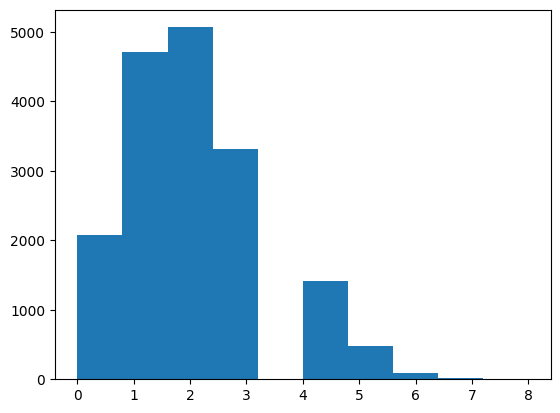

In [ ]:
plt.hist(df.drop(columns=['Composer', 'Artist']).isnull().sum(axis=1))

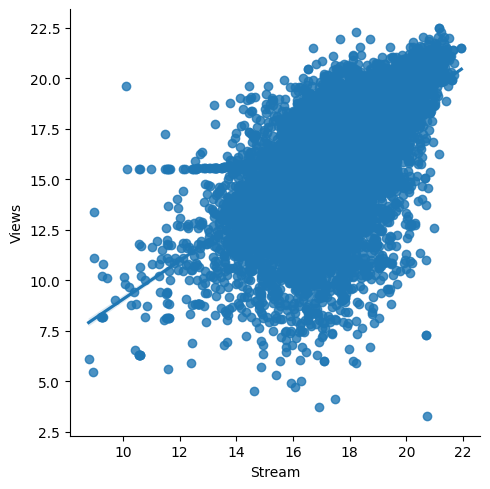

In [ ]:
log_stream_view = np.log(df[['Views', 'Stream']])
log_stream_view = log_stream_view.dropna()
stream_view = df[['Views', 'Stream']]
stream_view = stream_view.dropna()
sns.lmplot(data=log_stream_view, x='Stream', y='Views')

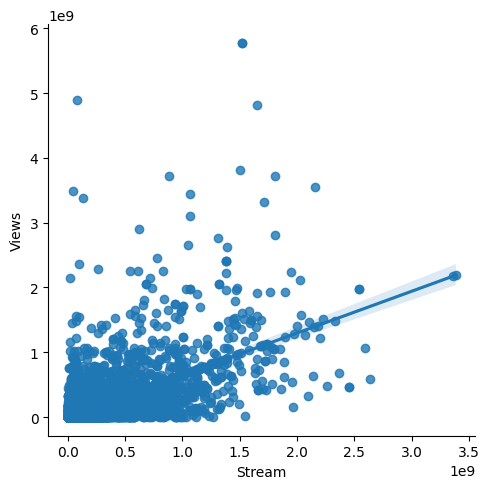

In [ ]:
sns.lmplot(data=stream_view, x='Stream', y='Views')

In [ ]:
from sklearn.linear_model import LinearRegression
lregressor = LinearRegression()
l_x = log_stream_view.Stream.values.reshape(log_stream_view.shape[0], 1)
l_y = log_stream_view.Views.values.reshape(log_stream_view.shape[0], 1)
lregressor.fit(l_x, l_y)
print(f'log(Views) = {lregressor.coef_[0,0]}*log(Stream){lregressor.intercept_[0]}')

log(Views) = 0.9543883177329437*log(Stream)-0.4866789815980255


The relation between Views and Stream is consider to be first order since the log coefficeint is almost one. 

In [ ]:
l_x = stream_view.Stream.values.reshape(stream_view.shape[0], 1)
l_y = stream_view.Views.values.reshape(stream_view.shape[0], 1)
lregressor.fit(l_x, l_y)
print(f'Views = {lregressor.coef_[0,0]}*Stream + {lregressor.intercept_[0]}')

Views = 0.6448289254110855*Stream + 5391522.305247873


In [ ]:
df['Views'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 17170 entries, 0 to 17169
Series name: Views
Non-Null Count  Dtype  
--------------  -----  
17170 non-null  float64
dtypes: float64(1)
memory usage: 134.3 KB


In [ ]:
df['Views'].mask(df['Views'].isna(), lregressor.coef_[0,0]*df['Stream']+lregressor.intercept_[0]).info()

<class 'pandas.core.series.Series'>
RangeIndex: 17170 entries, 0 to 17169
Series name: Views
Non-Null Count  Dtype  
--------------  -----  
17170 non-null  float64
dtypes: float64(1)
memory usage: 134.3 KB


In [ ]:
df['Views'] = df['Views'].mask(df['Views'].isna(), df['Stream']*lregressor.coef_[0,0] + lregressor.intercept_[0])  # change to linear
df['Likes'] = df['Likes']/df['Views']
df = df.rename(columns={'Likes': 'Like_rate'})

KeyError: ignored

In [ ]:
fill_columns = [
    'Energy', 'Key', 'Loudness', 'Speechiness', 'Acousticness', 
    'Instrumentalness', 'Liveness', 'Valence', 'Tempo',
    'Duration_ms', 'Views', 'Like_rate']
df[fill_columns] = df[fill_columns].fillna(df[fill_columns].median())

In [ ]:
df['Artist'] = df['Artist'].fillna('missing')
df['Composer'] = df['Composer'].fillna('missing')

In [ ]:
df.info()

## Drop uncorrelated features


In [ ]:
drop_columns = [
    'Stream', 'Album_type', 'Licensed', 'official_video',
    'id', 'Track', 'Album', 'Uri', 'Url_spotify', 'Url_youtube', 
    'Comments', 'Description', 'Title', 'Channel']
df = df.drop(columns=drop_columns)

## ~~Re-scale following features: Duration_ms and Views~~
because some data points of test data are not positive 

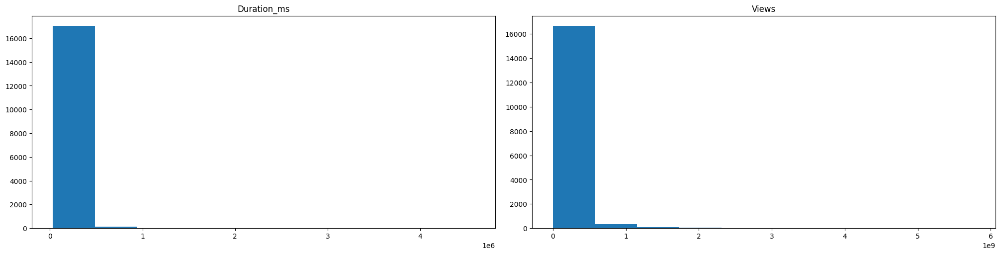

In [ ]:
fig, ax = plt.subplots(1, 2, constrained_layout = True, figsize=(20,5))
ax[0].set_title('Duration_ms')
ax[0].hist(df.Duration_ms)
ax[1].set_title('Views')
ax[1].hist(df.Views)
plt.show()

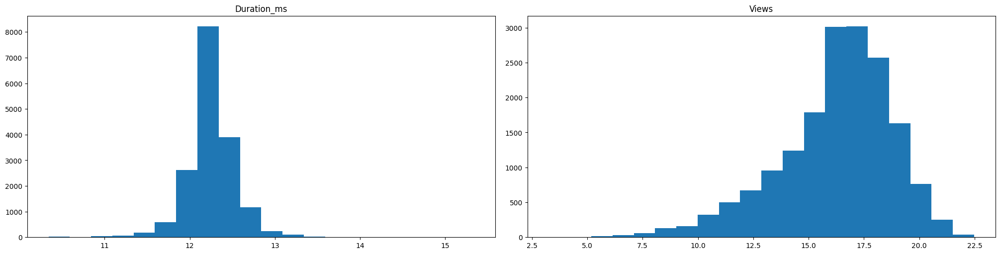

In [ ]:
fig, ax = plt.subplots(1, 2, constrained_layout = True, figsize=(20,5))
ax[0].set_title('Duration_ms')
ax[0].hist(np.log(df.Duration_ms), bins=20)
ax[1].set_title('Views')
ax[1].hist(np.log(df.Views), bins=20)
plt.show()

In [ ]:
# df['Duration_ms'] = np.log(df['Duration_ms'])
# df['Views'] = np.log(df['Views'])
# df = df.rename({'Duration_ms': 'log_Duration_ms', 'Views': 'log_Views'})

## Analyze the correlation across features

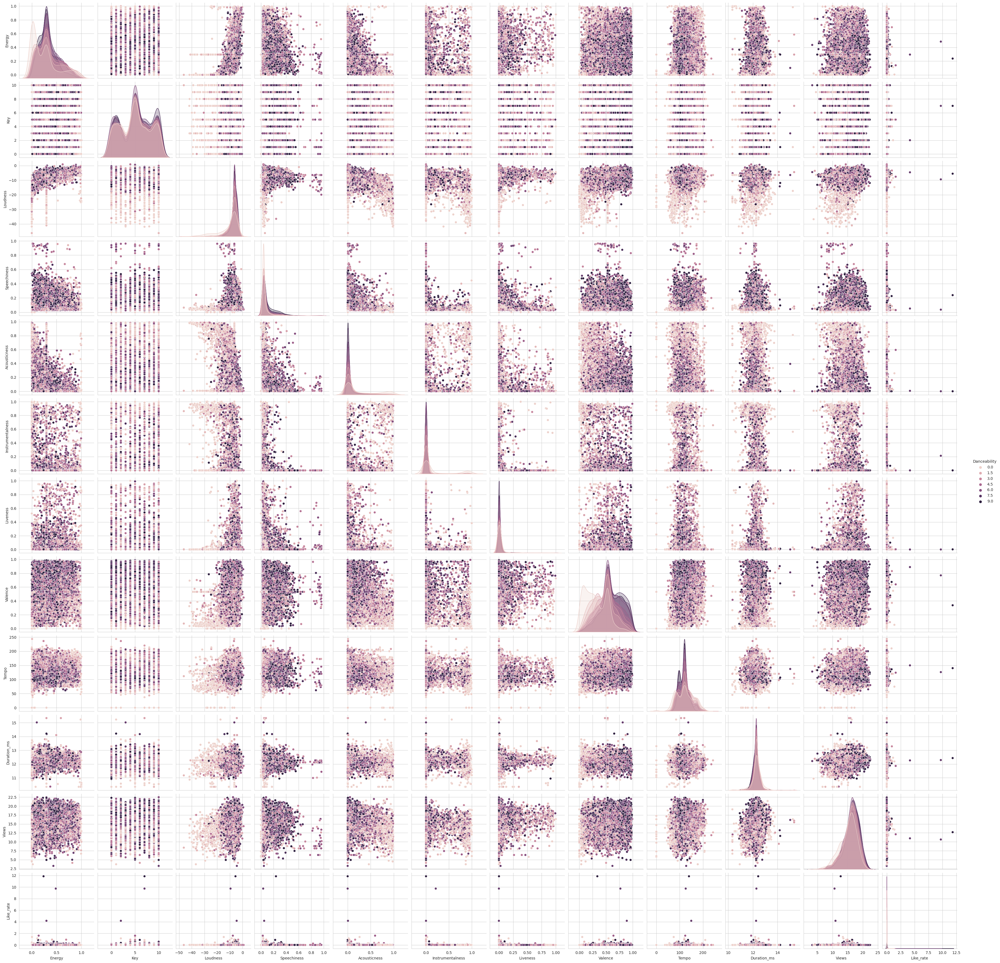

In [ ]:
numericaldf = df.iloc[:,0:13].copy()
sns.set_style('whitegrid');
sns.pairplot(numericaldf, hue='Danceability', height=3);
plt.show()

In [ ]:
corr = df.corr()
corr.style.background_gradient(cmap='coolwarm', axis=None).set_precision(2)

<ipython-input-24-8a2aad988d38>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.corr()
<ipython-input-24-8a2aad988d38>:2: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  corr.style.background_gradient(cmap='coolwarm', axis=None).set_precision(2)


,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valence,Tempo,Duration_ms,Views,Like_rate
Danceability,1.00,0.04,0.03,0.25,0.21,-0.28,-0.21,-0.08,0.39,-0.09,-0.10,0.13,0.02
Energy,0.04,1.00,0.02,0.47,0.04,-0.39,-0.11,0.12,0.26,0.12,0.01,0.08,-0.00
Key,0.03,0.02,1.00,0.03,0.02,-0.02,0.00,-0.00,0.04,0.00,0.00,0.02,0.00
Loudness,0.25,0.47,0.03,1.00,0.07,-0.54,-0.48,0.03,0.27,0.13,0.08,0.27,0.00
Speechiness,0.21,0.04,0.02,0.07,1.00,-0.12,-0.09,0.03,0.05,0.06,-0.08,-0.03,0.01
Acousticness,-0.28,-0.39,-0.02,-0.54,-0.12,1.00,0.35,-0.02,-0.24,-0.11,-0.09,-0.19,-0.00
Instrumentalness,-0.21,-0.11,0.00,-0.48,-0.09,0.35,1.00,-0.02,-0.22,-0.07,-0.08,-0.21,0.00
Liveness,-0.08,0.12,-0.00,0.03,0.03,-0.02,-0.02,1.00,0.02,0.01,-0.00,0.00,-0.01
Valence,0.39,0.26,0.04,0.27,0.05,-0.24,-0.22,0.02,1.00,0.08,-0.04,0.08,-0.00
Tempo,-0.09,0.12,0.00,0.13,0.06,-0.11,-0.07,0.01,0.08,1.00,0.00,0.04,0.01


<Axes: >

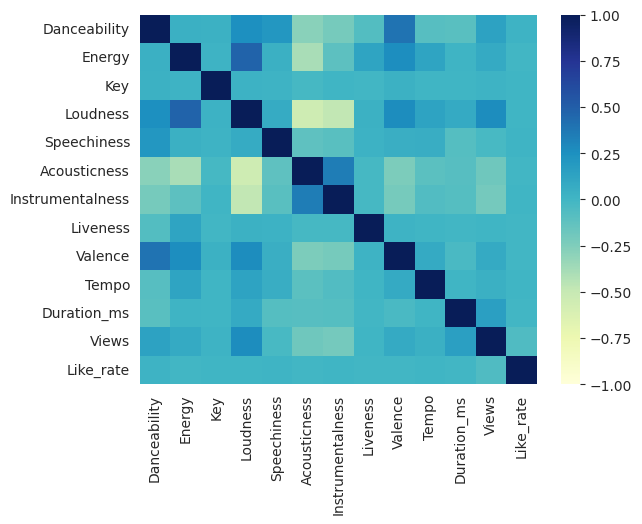

In [ ]:
sns.heatmap(corr, 
            vmin = -1,
            vmax = 1,
            center = 0,
            cmap =  "YlGnBu",
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

## ~~Categorize the Key feature~~
bad performance

In [ ]:
# df.Key.unique()

array([ 3.,  7.,  6.,  5., 10.,  1.,  2.,  0.,  4.,  8.,  9.])

In [ ]:
# df = pd.get_dummies(df, prefix='Key', prefix_sep='_', columns=['Key'], drop_first=True)

## Categorize artists and composers

### analyze the importance of each artist and composer 

In [ ]:
df['Artist'].value_counts()

missing                2566
Sufjan Stevens          763
Billie Eilish           692
Marshmello              519
deadmau5                510
                       ... 
LCD Soundsystem          10
Megan Thee Stallion      10
Harry Styles              7
John Legend               7
Father John Misty         2
Name: Artist, Length: 97, dtype: int64

In [ ]:
top10artist = df['Artist'].value_counts().index[0:10].tolist()
top10artist

['missing',
 'Sufjan Stevens',
 'Billie Eilish',
 'Marshmello',
 'deadmau5',
 'Flume',
 'Tyler, The Creator',
 'Shawn Mendes',
 'The Chainsmokers',
 'Anderson .Paak']

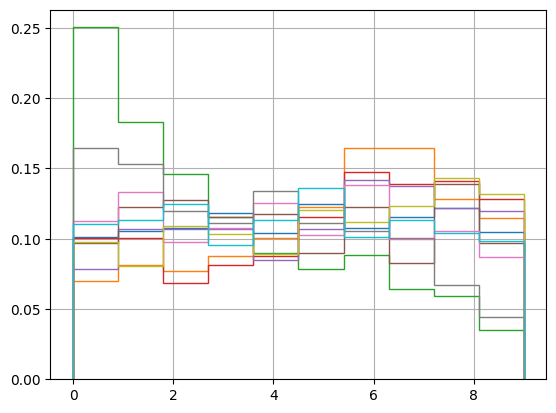

In [ ]:
for i in top10artist:
  df[df['Artist']==i]['Danceability'].hist(density=True, histtype=u'step')

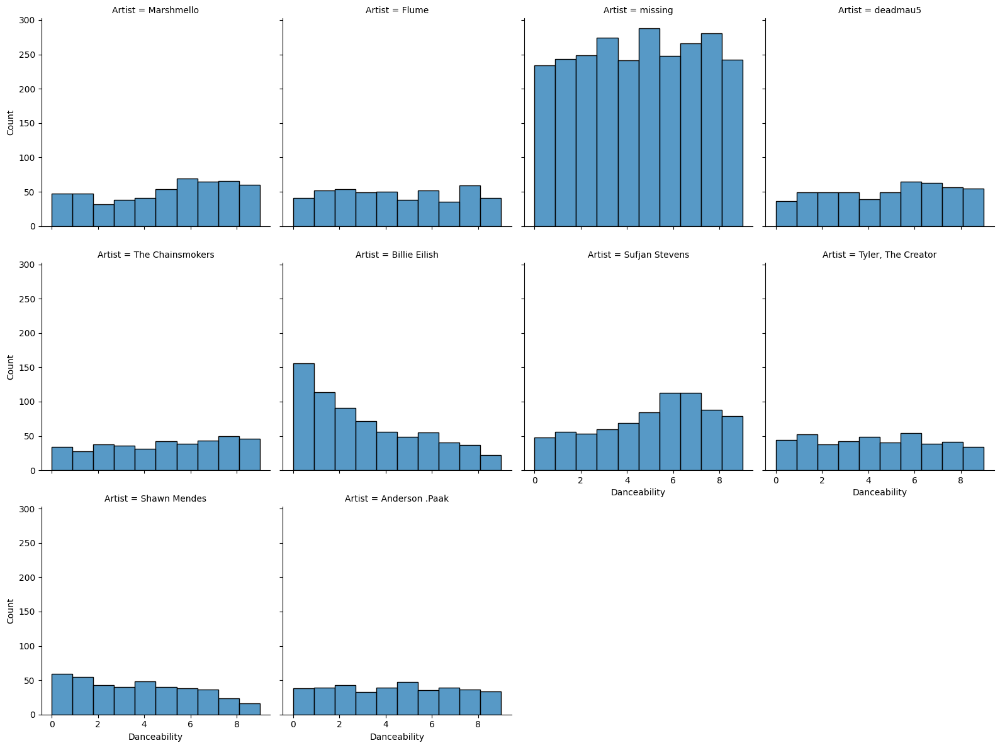

In [ ]:
g = sns.displot(data=df[df['Artist'].isin(top10artist)], x='Danceability', col='Artist', col_wrap=4, height=4, common_bins=True, bins=10)

In [ ]:
artist_rsquare = pd.DataFrame(columns=['artist', 'R^2', 'counts'])
from sklearn.linear_model import LinearRegression
aregressor = LinearRegression()
for i in df['Artist'].unique():
  df_a = df[df['Artist'] == i]
  X_a = df_a.drop(columns = ['Danceability', 'Composer', 'Artist']) 
  y_a = df_a.Danceability.values.reshape(df_a.shape[0], 1)
  aregressor.fit(X_a, y_a)
  new_row = {'artist': i, 'R^2': round(aregressor.score(X_a, y_a), 4), 'counts': df_a.shape[0]}
  artist_rsquare = artist_rsquare.append(new_row, ignore_index=True)

In [ ]:
artist_rsquare.head()

,artist,R^2,counts
0,Marshmello,0.2886,519
1,Bon Iver,0.3090,374
2,Kamasi Washington,0.2659,179
3,Drake,0.2878,164
4,Alicia Keys,0.3526,272


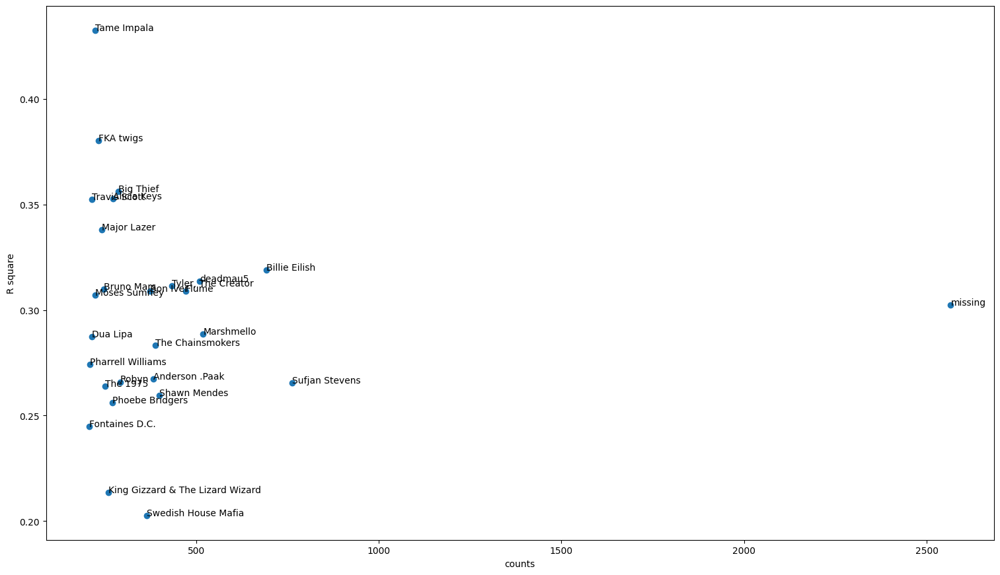

In [ ]:
fig, ax = plt.subplots()
fig.set_size_inches(18.5, 10.5, forward=True)
z = artist_rsquare[artist_rsquare.counts>=200]['counts'].tolist()
y = artist_rsquare[artist_rsquare.counts>=200]['R^2'].tolist()
n = artist_rsquare[artist_rsquare.counts>=200]['artist'].tolist()
ax.scatter(z, y)
ax.set_xlabel('counts')
ax.set_ylabel('R square')
for i, txt in enumerate(n):
    ax.annotate(txt, (z[i], y[i]))

In [ ]:
df['Composer'].value_counts()

Finneas O'Connell    3009
missing              2558
Terrace Martin       2536
Louis Bell           2107
Juicy J              1874
Yeti Beats           1559
Ludwig Göransson     1230
Mike Dean            1153
Noah "40" Shebib      929
Ricky Reed            134
J. Cole                81
Name: Composer, dtype: int64

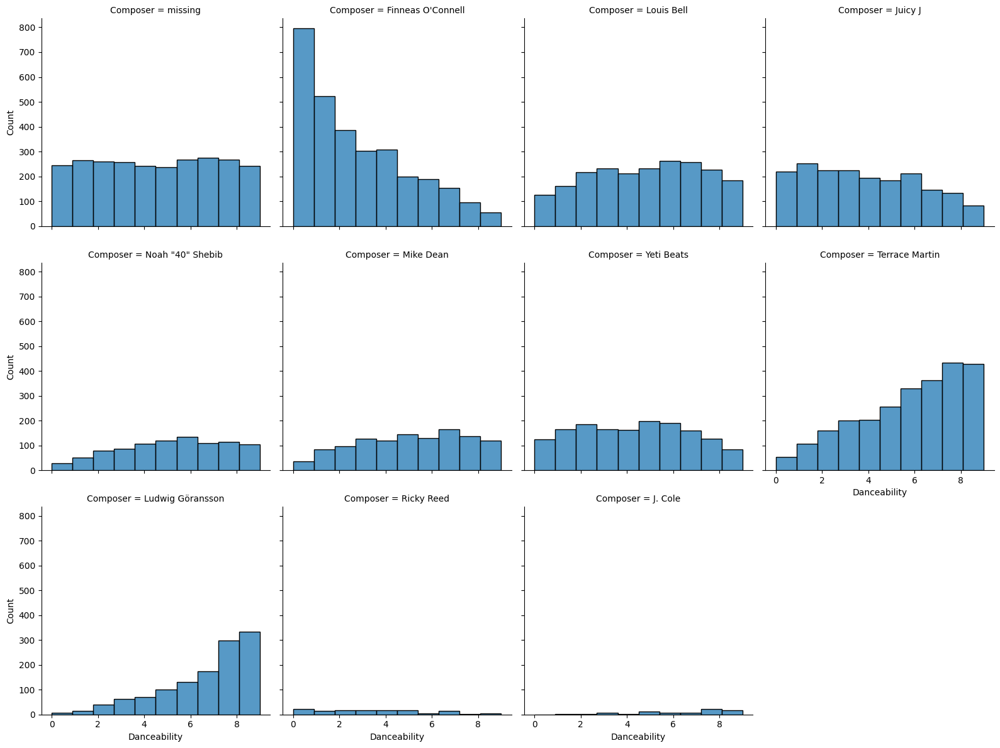

In [ ]:
g = sns.displot(data=df, x='Danceability', col='Composer', col_wrap=4, height=4, common_bins=True, bins=10)

In [ ]:
composer_rsquare = pd.DataFrame(columns=['composer', 'R^2', 'counts'])
from sklearn.linear_model import LinearRegression
cregressor = LinearRegression()
for i in df['Composer'].unique():
  df_c = df[df['Composer'] == i]
  X_c = df_c.drop(columns = ['Danceability', 'Composer', 'Artist']) 
  y_c = df_c.Danceability.values.reshape(df_c.shape[0], 1)
  cregressor.fit(X_c, y_c)
  new_row = {'composer': i, 'R^2': round(cregressor.score(X_c, y_c), 4), 'counts': df_c.shape[0]}
  composer_rsquare = composer_rsquare.append(new_row, ignore_index=True)
  # print(i,'\n' ,'(1)R square is', round(cregressor.score(X_c, y_c), 4), '(2)number of songs is', df_c.shape[0])
composer_rsquare.head()

<ipython-input-49-100f28003689>:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  composer_rsquare = composer_rsquare.append(new_row, ignore_index=True)
<ipython-input-49-100f28003689>:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  composer_rsquare = composer_rsquare.append(new_row, ignore_index=True)
<ipython-input-49-100f28003689>:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  composer_rsquare = composer_rsquare.append(new_row, ignore_index=True)
<ipython-input-49-100f28003689>:10: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  composer_rsquare = composer_rsquare.append(new_row, ignore_index=True)
<ipython-input-49-100f28003689>:

,composer,R^2,counts
0,missing,0.2754,2558
1,Finneas O'Connell,0.2764,3009
2,Louis Bell,0.2544,2107
3,Juicy J,0.2586,1874
4,"Noah ""40"" Shebib",0.2264,929


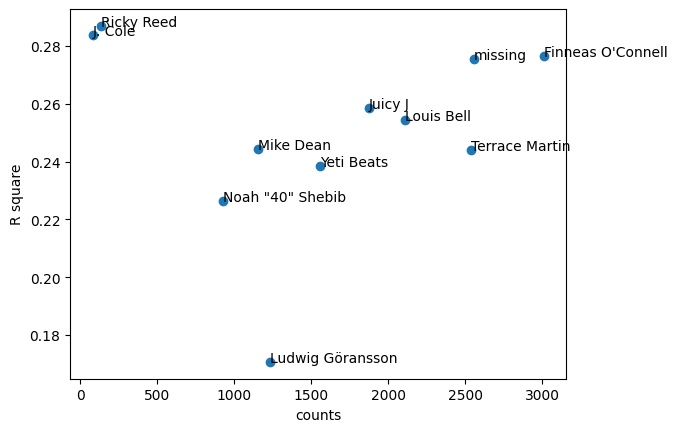

In [ ]:
fig, ax = plt.subplots()
z = composer_rsquare['counts'].tolist()
y = composer_rsquare['R^2'].tolist()
n = composer_rsquare['composer'].tolist()
ax.scatter(z, y)
ax.set_xlabel('counts')
ax.set_ylabel('R square')
for i, txt in enumerate(n):
    ax.annotate(txt, (z[i], y[i]))

### drop artist

In [ ]:
import copy
artist_to_drop = copy.copy(df.Artist.unique().tolist())

AttributeError: ignored

In [ ]:
artist_to_drop.remove('missing')
artist_to_drop.remove('Sufjan Stevens')
artist_to_drop.remove('Swedish House Mafia')
artist_to_drop.remove('King Gizzard & The Lizard Wizard')
artist_to_drop.remove('A$AP Rocky')

In [ ]:
df = pd.get_dummies(df, prefix='', prefix_sep='', columns=['Artist'], drop_first=True)

In [ ]:
df = df.assign(Artist_others = lambda x: 1 - x['missing'] - x['Sufjan Stevens'] - 
               x['Swedish House Mafia'] - x['King Gizzard & The Lizard Wizard'])

In [ ]:
df = df.drop(columns=artist_to_drop)

### drop composer

This explains why the graph below shows that xgboost scores Ludwig Göransson and Terrace Martin the most because they have many songs listed and their songs are hardly evaluted by other features (R square are relatively low).

In [ ]:
df = pd.get_dummies(df, prefix='Composer', prefix_sep='_', columns=['Composer'], drop_first=True)

In [ ]:
df.columns

Index(['Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness',
       'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo',
       'Duration_ms', 'Views', 'Like_rate', 'Artist', 'Composer_J. Cole',
       'Composer_Juicy J', 'Composer_Louis Bell', 'Composer_Ludwig Göransson',
       'Composer_Mike Dean', 'Composer_Noah "40" Shebib',
       'Composer_Ricky Reed', 'Composer_Terrace Martin', 'Composer_Yeti Beats',
       'Composer_missing'],
      dtype='object')

from the data we observe, some of the composers are not important

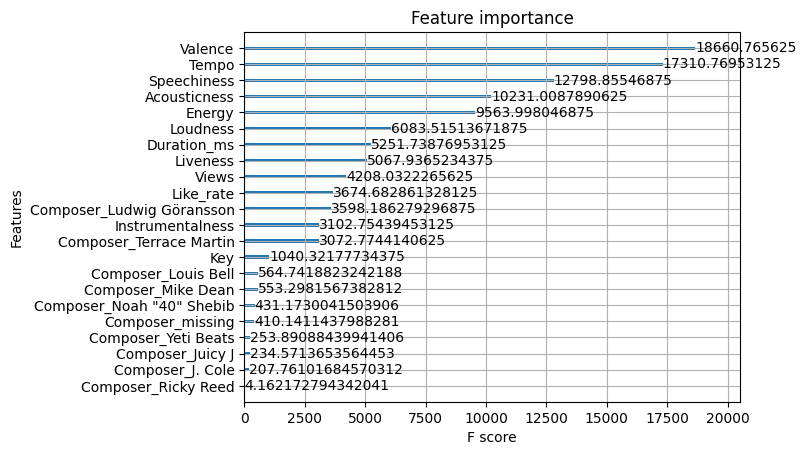

In [ ]:
composer_to_drop = ['Composer_J. Cole',
       'Composer_Juicy J', 'Composer_Louis Bell',
       'Composer_Mike Dean', 'Composer_Noah "40" Shebib',
       'Composer_Ricky Reed', 'Composer_Yeti Beats',]
df = df.assign(Composer_others = lambda x: 1 - x['Composer_Terrace Martin'] - x['Composer_Ludwig Göransson']- x['Composer_missing'])

In [ ]:
df = df.drop(columns=composer_to_drop)

# Training and Cross Validation

## Training testing data split


In [ ]:
X = df.drop(columns=['Danceability'])  #, 'Instrumentalness' , 'Artist', 'Key'
y = df['Danceability']

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=8)

## Fit XGB classifier 

In [ ]:
!pip install category_encoders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 kB 3.0 MB/s eta 0:00:00


In [ ]:
from sklearn.pipeline import Pipeline
from category_encoders.target_encoder import TargetEncoder
from xgboost import XGBClassifier

estimators = [
    ('encoder', TargetEncoder()),
    ('clf', XGBClassifier(objective='multi:softmax', random_state=8, num_class=10, n_jobs=-1, colsample_bylevel=0.9, colsample_bynode=0.95,
                colsample_bytree=0.65, learning_rate=0.1, gamma=0, n_estimators=200)) 
    # can customize objective function with the objective parameter which is used to find error_in
]
pipe = Pipeline(steps=estimators)
pipe

Pipeline(steps=[('encoder', TargetEncoder()),
                ('clf',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=0.9, colsample_bynode=0.95,
                               colsample_bytree=0.65,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=0, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               min_child_weight=None, missing=nan,
                               monotone_constraints=None, n_estimators=200,
                               n_jobs=-1, num_class=10, num_parallel_tree=None,
                               objective='multi:softmax', ...))])

In [ ]:
!pip install scikit-optimize
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

search_space = {
    'clf__max_depth': Integer(3, 10),
    'clf__min_child_weight': Integer(10, 20),
    # 'clf__learning_rate': Real(0.001, 0.1, prior='log-uniform'),
    # 'clf__subsample': Real(0.5, 1.0),
    'clf__alpha': Real(0.0, 15.0),
    # 'clf__gamma': Real(0.0, 10.0)
}


opt = BayesSearchCV(pipe, search_space, cv=5, n_iter=20, random_state=8)   
# change scoring to change loss function in case we want to use scoring=sklearn.metrics.mean_absolute_error
# n_iter should be larger (100~500)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
opt.fit(X_train, y_train)

BayesSearchCV(cv=5,
              estimator=Pipeline(steps=[('encoder', TargetEncoder()),
                                        ('clf',
                                         XGBClassifier(base_score=None,
                                                       booster=None,
                                                       callbacks=None,
                                                       colsample_bylevel=0.9,
                                                       colsample_bynode=0.95,
                                                       colsample_bytree=0.65,
                                                       early_stopping_rounds=None,
                                                       enable_categorical=False,
                                                       eval_metric=None,
                                                       feature_types=None,
                                                       gamma=0, gpu_id=None,
                                                       grow_policy=None,
                                                       importance_type=None,...
                                                       n_jobs=-1, num_class=10,
                                                       num_parallel_tree=None,
                                                       objective='multi:softmax', ...))]),
              n_iter=20, random_state=8,
              search_spaces={'clf__alpha': Real(low=0.0, high=15.0, prior='uniform', transform='normalize'),
                             'clf__max_depth': Integer(low=3, high=10, prior='uniform', transform='normalize'),
                             'clf__min_child_weight': Integer(low=10, high=20, prior='uniform', transform='normalize')})

In [ ]:
opt.best_estimator_

Pipeline(steps=[('encoder', TargetEncoder(cols=[])),
                ('clf',
                 XGBClassifier(alpha=3.0336700701320893, base_score=None,
                               booster=None, callbacks=None,
                               colsample_bylevel=0.9, colsample_bynode=0.95,
                               colsample_bytree=0.65,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=0, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=10, max_leaves=None,
                               min_child_weight=10, missing=nan,
                               monotone_constraints=None, n_estimators=200,
                               n_jobs=-1, num_class=10, num_parallel_tree=None, ...))])

In [ ]:
opt.best_score_

0.2724225289570891

In [ ]:
opt.score(X_test, y_test)

0.2833430401863716

In [ ]:
opt.predict(X_test)

array([2, 8, 1, ..., 7, 8, 4], dtype=int32)

In [ ]:
opt.predict_proba(X_test)

array([[0.02654532, 0.1255951 , 0.1399847 , ..., 0.13365225, 0.13566601,
        0.08343088],
       [0.00244089, 0.01859044, 0.01613325, ..., 0.107727  , 0.4615605 ,
        0.2670463 ],
       [0.05562076, 0.6073452 , 0.05337626, ..., 0.01356607, 0.01100921,
        0.01467973],
       ...,
       [0.00666636, 0.01378223, 0.0283367 , ..., 0.34544754, 0.20385432,
        0.02052148],
       [0.00072067, 0.00373388, 0.00687596, ..., 0.04439428, 0.51024413,
        0.28170657],
       [0.00813813, 0.03262918, 0.05461476, ..., 0.18112694, 0.07081895,
        0.11931598]], dtype=float32)

In [ ]:
opt.best_estimator_.steps

[('encoder', TargetEncoder(cols=[])),
 ('clf',
  XGBClassifier(alpha=3.0336700701320893, base_score=None, booster=None,
                callbacks=None, colsample_bylevel=0.9, colsample_bynode=0.95,
                colsample_bytree=0.65, early_stopping_rounds=None,
                enable_categorical=False, eval_metric=None, feature_types=None,
                gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
                interaction_constraints=None, learning_rate=0.1, max_bin=None,
                max_cat_threshold=None, max_cat_to_onehot=None,
                max_delta_step=None, max_depth=10, max_leaves=None,
                min_child_weight=10, missing=nan, monotone_constraints=None,
                n_estimators=200, n_jobs=-1, num_class=10, num_parallel_tree=None, ...))]

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

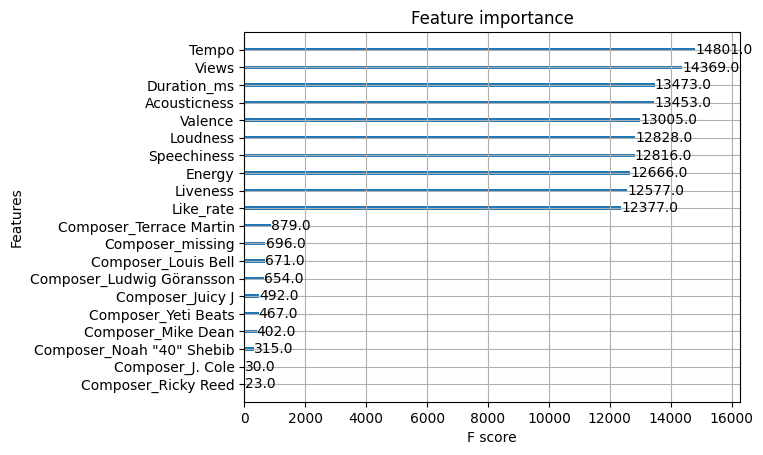

In [ ]:
from xgboost import plot_importance

xgboost_step = opt.best_estimator_.steps[1]
xgboost_model = xgboost_step[1]
plot_importance(xgboost_model)

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

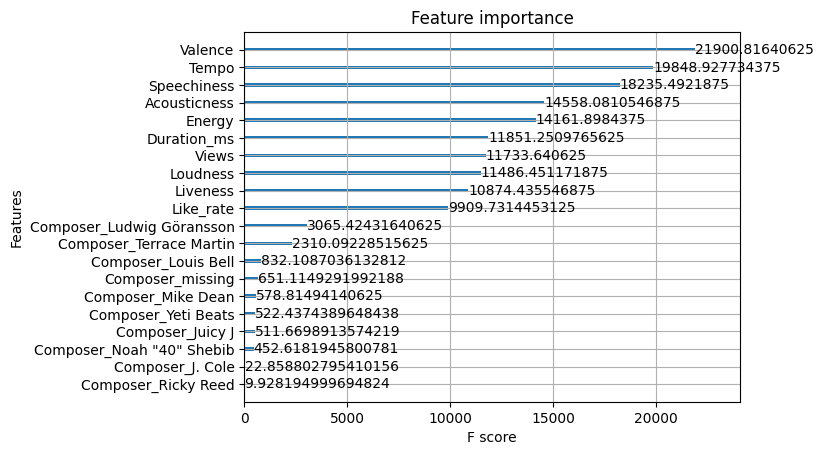

In [ ]:
plot_importance(xgboost_model, importance_type='total_gain')

In [ ]:
opt.best_estimator_.steps[1][1]

XGBClassifier(alpha=3.0336700701320893, base_score=None, booster=None,
              callbacks=None, colsample_bylevel=0.9, colsample_bynode=0.95,
              colsample_bytree=0.65, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=10, missing=nan, monotone_constraints=None,
              n_estimators=200, n_jobs=-1, num_class=10, num_parallel_tree=None, ...)

In [ ]:
np.absolute(opt.predict(X_test)-y_test).mean()

1.7341292952824694

In [ ]:
eval_set = [(X_train, y_train), (X_test, y_test)]
xgboost_model.fit(X_train, y_train, eval_metric="aucpr", eval_set=eval_set, verbose=False)

XGBClassifier(alpha=3.0336700701320893, base_score=None, booster=None,
              callbacks=None, colsample_bylevel=0.9, colsample_bynode=0.95,
              colsample_bytree=0.65, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=10, missing=nan, monotone_constraints=None,
              n_estimators=200, n_jobs=-1, num_class=10, num_parallel_tree=None, ...)

In [ ]:
results = xgboost_model.evals_result()
train_error = results['validation_0']['aucpr']
test_error = results['validation_1']['aucpr']
num_iterations = len(train_error)

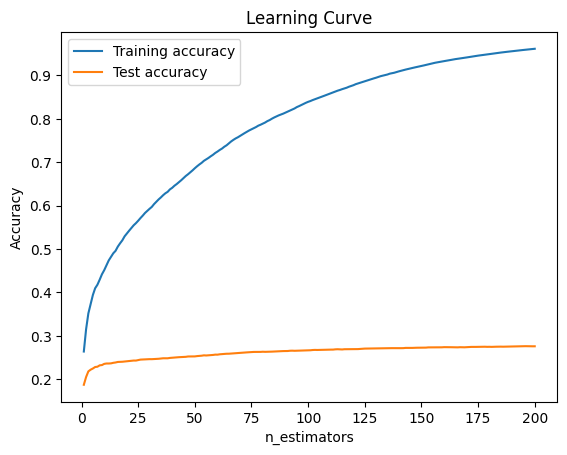

In [ ]:
plt.plot(range(1, num_iterations+1), train_error, label='Training accuracy')
plt.plot(range(1, num_iterations+1), test_error, label='Test accuracy')
plt.xlabel('n_estimators')
plt.ylabel('Accuracy')
plt.title('Learning Curve')
plt.legend()
plt.show()

## Fit XGB regressor

In [ ]:
!pip install category_encoders
from sklearn.pipeline import Pipeline
from category_encoders.target_encoder import TargetEncoder
from xgboost import XGBRegressor

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 kB 8.4 MB/s eta 0:00:00


In [ ]:
estimators = [
    ('encoder', TargetEncoder()),
    ('clf', XGBRegressor(objective='reg:absoluteerror', colsample_bylevel=0.7, colsample_bynode=0.9093339514705211,
               colsample_bytree=0.8, random_state=8, n_jobs=-1, eval_metric='mae', n_estimators=200, gamma=9.11,
               learning_rate=0.1, max_depth=32))
    # can customize objective function with the objective parameter which is used to find error_in
]
pipe = Pipeline(steps=estimators)
pipe

Pipeline(steps=[('encoder', TargetEncoder()),
                ('clf',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=0.7,
                              colsample_bynode=0.9093339514705211,
                              colsample_bytree=0.8, early_stopping_rounds=None,
                              enable_categorical=False, eval_metric='mae',
                              feature_types=None, gamma=9.11, gpu_id=None,
                              grow_policy=None, importance_type=None,
                              interaction_constraints=None, learning_rate=0.1,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=32, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, n_estimators=200,
                              n_jobs=-1, num_parallel_tree=None,
                              objective='reg:absoluteerror', predictor=None, ...))])

In [ ]:
!pip install scikit-optimize
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 kB 10.5 MB/s eta 0:00:00


In [ ]:
search_space = {
    # 'clf__max_depth': Integer(15, 40),
    # 'clf__colsample_bylevel': Real(0.5, 1.0), 
    # 'clf__colsample_bynode': Real(0.9, 1.0),
    # 'clf__colsample_bytree': Real(0.8, 1.0), 
    'clf__min_child_weight': Integer(35, 50),
    # 'clf__n_estimators': Integer(100, 500), best is around 250 after training
    # 'clf__learning_rate': Real(0.05, 0.40, prior='log-uniform'),
    # 'clf__subsample': Real(0.5, 1.0),
    # 'clf__alpha': Real(0.0, 10.0), is 0 after training
    # 'clf__gamma': Real(0.0, 20.0)
}

opt_reg = BayesSearchCV(pipe, search_space, cv=5, n_iter=40, random_state=8, scoring='neg_mean_absolute_error')

In [ ]:
# opt_reg = XGBRegressor(base_score=None, booster=None, callbacks=None,
#                colsample_bylevel=0.7, colsample_bynode=0.9093339514705211,
#                colsample_bytree=0.8, early_stopping_rounds=None,
#                enable_categorical=False, eval_metric='mae', feature_types=None,
#                gamma=9.113401021650647, gpu_id=None, grow_policy=None,
#                importance_type=None, interaction_constraints=None,
#                learning_rate=0.1, max_bin=None, max_cat_threshold=None,
#                max_cat_to_onehot=None, max_delta_step=None, max_depth=20,
#                max_leaves=None, min_child_weight=40,
#                monotone_constraints=None, n_estimators=300, n_jobs=-1,
#                num_parallel_tree=None, objective='reg:absoluteerror')      best predictor so far with key and all composers

In [ ]:
opt_reg.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:420: ConvergenceWarning: The optimal value found for dimension 0 of parameter k2__noise_level is close to the specified lower bound 1e-05. Decreasing the bound and calling fit again may find a better value.
  warnings.warn(


BayesSearchCV(cv=5,
              estimator=Pipeline(steps=[('encoder', TargetEncoder()),
                                        ('clf',
                                         XGBRegressor(base_score=None,
                                                      booster=None,
                                                      callbacks=None,
                                                      colsample_bylevel=0.7,
                                                      colsample_bynode=0.9093339514705211,
                                                      colsample_bytree=0.8,
                                                      early_stopping_rounds=None,
                                                      enable_categorical=False,
                                                      eval_metric='mae',
                                                      feature_types=None,
                                                      gamma=9.11, gpu_id=None,
                                                      grow_policy=None,
                                                      impor...
                                                      max_depth=32,
                                                      max_leaves=None,
                                                      min_child_weight=None,
                                                      missing=nan,
                                                      monotone_constraints=None,
                                                      n_estimators=200,
                                                      n_jobs=-1,
                                                      num_parallel_tree=None,
                                                      objective='reg:absoluteerror',
                                                      predictor=None, ...))]),
              n_iter=40, random_state=8, scoring='neg_mean_absolute_error',
              search_spaces={'clf__min_child_weight': Integer(low=35, high=50, prior='uniform', transform='normalize')})

In [ ]:
opt_reg.best_score_

-1.602170259859254

In [ ]:
opt_reg.score(X_test, y_test)  # is mean absolute error

-1.6079997330490146

In [ ]:
opt_reg.predict(X_test)

array([5.0125556, 8.023123 , 2.4115248, ..., 7.5071616, 8.491407 ,
       5.6817164], dtype=float32)

In [ ]:
opt_reg.best_estimator_.steps

[('encoder', TargetEncoder(cols=[])),
 ('clf',
  XGBRegressor(base_score=None, booster=None, callbacks=None,
               colsample_bylevel=0.7, colsample_bynode=0.9093339514705211,
               colsample_bytree=0.8, early_stopping_rounds=None,
               enable_categorical=False, eval_metric='mae', feature_types=None,
               gamma=9.11, gpu_id=None, grow_policy=None, importance_type=None,
               interaction_constraints=None, learning_rate=0.1, max_bin=None,
               max_cat_threshold=None, max_cat_to_onehot=None,
               max_delta_step=None, max_depth=32, max_leaves=None,
               min_child_weight=40, missing=nan, monotone_constraints=None,
               n_estimators=200, n_jobs=-1, num_parallel_tree=None,
               objective='reg:absoluteerror', predictor=None, ...))]

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

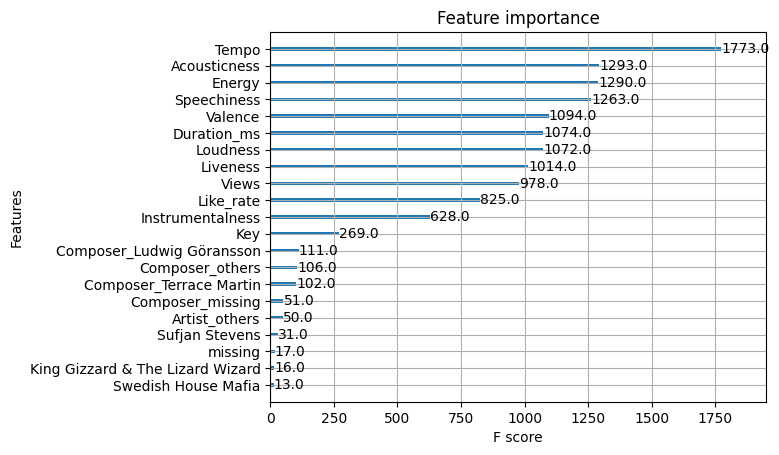

In [ ]:
from xgboost import plot_importance

xgboost_step = opt_reg.best_estimator_.steps[1]
xgboost_model = xgboost_step[1]
plot_importance(xgboost_model)

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

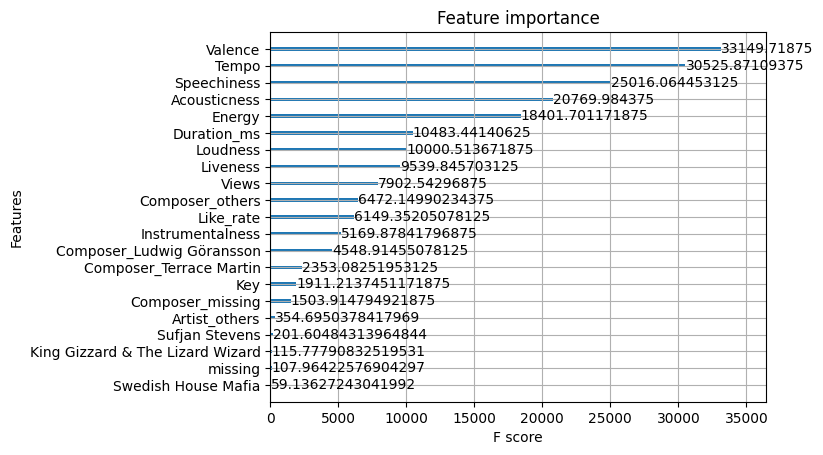

In [ ]:
plot_importance(xgboost_model, importance_type='total_gain')

In [ ]:
np.absolute(opt_reg.predict(X_test)-y_test).mean()

1.6079997330490146

In [ ]:
np.absolute(np.round(opt_reg.predict(X_test))-y_test).mean()

1.5926033779848574

In [ ]:
eval_set = [(X_train, y_train), (X_test, y_test)]
xgboost_model.fit(X_train, y_train, eval_set=eval_set, verbose=False)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=0.7, colsample_bynode=0.9093339514705211,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric='mae', feature_types=None,
             gamma=9.11, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=32, max_leaves=None,
             min_child_weight=40, missing=nan, monotone_constraints=None,
             n_estimators=200, n_jobs=-1, num_parallel_tree=None,
             objective='reg:absoluteerror', predictor=None, ...)

In [ ]:
results = xgboost_model.evals_result()
train_error = results['validation_0']['mae']
test_error = results['validation_1']['mae']
num_iterations = len(train_error)

In [ ]:
test_error.index(min(test_error))  # the better n_estimators

198

TypeError: ignored

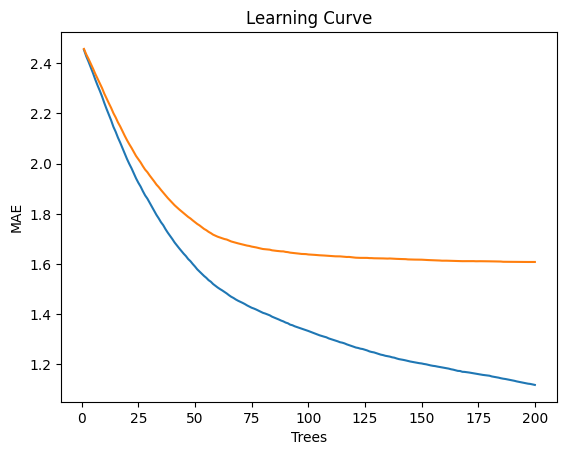

In [ ]:
plt.plot(range(1, num_iterations+1), train_error, label='Training MAE')
plt.plot(range(1, num_iterations+1), test_error, label='Testing MAE')
plt.xlabel('Trees')
plt.ylabel('MAE')
plt.title('Learning Curve')
plt.legend()
plt.show()

## Find best n_estimators

In [ ]:
import copy
model2 = copy.deepcopy(opt_reg.best_estimator_.steps[1][1])
model2.n_estimators = 1000  # test_error.index(min(test_error)) use the value min(test_error) a.k.a. the bottom of testing MAE curve
model2.fit(X_train, y_train, eval_set=eval_set, verbose=False)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=0.7, colsample_bynode=0.9093339514705211,
             colsample_bytree=0.8, early_stopping_rounds=None,
             enable_categorical=False, eval_metric='mae', feature_types=None,
             gamma=9.11, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=32, max_leaves=None,
             min_child_weight=40, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=-1, num_parallel_tree=None,
             objective='reg:absoluteerror', predictor=None, ...)

In [ ]:
results = model2.evals_result()
train_error = results['validation_0']['mae']
test_error = results['validation_1']['mae']
num_iterations = len(train_error)

In [ ]:
results['validation_1']['mae'].index(min(results['validation_1']['mae']))

566

TypeError: ignored

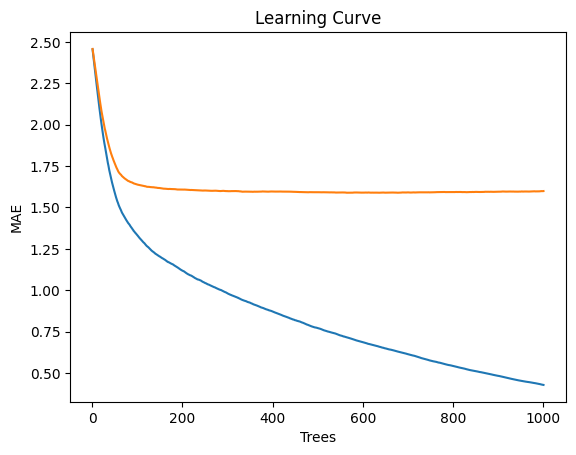

In [ ]:
plt.plot(range(1, num_iterations+1), train_error, label='Training MAE')
plt.plot(range(1, num_iterations+1), test_error, label='Testing MAE')
plt.xlabel('Trees')
plt.ylabel('MAE')
plt.title('Learning Curve')
plt.legend()
plt.show()

In [ ]:
print('Mean absolute error:', np.absolute(model2.predict(X_test)-y_test).mean(),
      '\nRound mean absolute error:', np.absolute(np.round(model2.predict(X_test))-y_test).mean())

Mean absolute error: 1.5988239507494906 
Round mean absolute error: 1.580663948747816


# Prediction

## Testing data transform

In [ ]:
drop_columns2 = filter(lambda x: x != 'id', drop_columns)
df_p = (
    pd.read_csv(url + 'test.csv')
    .assign(
        Views = lambda x: x.Views.mask(x['Views'].isna(), x.Stream*lregressor.coef_[0,0]+lregressor.intercept_[0]),
        Likes = lambda x: x.Likes/x.Views
    )
    .rename(columns={'Likes': 'Like_rate'})
    .drop(columns=drop_columns2)
)
df_p[fill_columns] = df_p[fill_columns].fillna(df_p[fill_columns].median())

In [ ]:
df_p = (df_p
    # df_p.assign(
    #    Duration_ms = lambda x: np.log(x.Duration_ms),
    #    Views = lambda x: np.log(x.Views) 
    # )
    # .rename({'Duration_ms': 'log_Duration_ms', 'Views': 'log_Views'})
    .fillna({'Composer': 'missing', 'Artist': 'missing'})
)

In [ ]:
df_p = pd.get_dummies(df_p, prefix='Composer', prefix_sep='_', columns=['Composer'], drop_first=True)
df_p = df_p.assign(Composer_others = lambda x: 1 - x['Composer_Terrace Martin'] - x['Composer_Ludwig Göransson']- x['Composer_missing'])
df_p = df_p.drop(columns=composer_to_drop)

In [ ]:
X_p = df_p.drop(columns=['Artist', 'id', 'Key'])  #'Instrumentalness'

## predict with training data

In [ ]:
predict_value = opt_reg.predict(X_p)

In [ ]:
submission = pd.DataFrame(data = {'id': df_p.id, 'Danceability': predict_value})

In [ ]:
submission.to_csv(url + 'xgboost_reg_composer_category0508_tuned.csv', index=False)

## Refit all the data

In [ ]:
# model = opt_reg.best_estimator_.steps[1][1]
model2.fit(X,y)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=0.7, colsample_bynode=0.9590887210789425,
             colsample_bytree=0.6, early_stopping_rounds=None,
             enable_categorical=False, eval_metric='mae', feature_types=None,
             gamma=18.909747833288947, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.29999999999999993, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=39, missing=nan, monotone_constraints=None,
             n_estimators=12, n_jobs=-1, num_parallel_tree=None,
             objective='reg:absoluteerror', predictor=None, ...)

In [ ]:
predict_all = np.round(model2.predict(X_p))
submission_all = pd.DataFrame(data = {'id': df_p.id, 'Danceability': predict_all})
submission_all.to_csv(url + 'xgboost_reg_round_nolog_gpuhist.csv', index=False)